In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString

In [2]:
# -----------------------------
# File paths (edit these)
# -----------------------------
# Profile lines
is2_profile_csv = "C:/Users/yhqian/Downloads/QGIS_maps/PointClouds_2_Raster/ICESat-2/strong_beams/UMDRDA_ATL03_20190410152144_01890303_007_01_gt2l_DTU21_Elevation_epsg3413_drift_02112026_quater_left_minus600_cropped.csv"      # has header: x_3413_dc,y_3413_dc,ele
# oib_profile_txt = "C:/Users/yhqian/Downloads/QGIS_maps/PointClouds_2_Raster/ICESat-2/strong_beams/UMDRDA_ATL03_20190410152144_01890303_007_01_gt2l_DTU21_Elevation_epsg3413_drift_minus_dx_02132026_quater_600_crop_profile_interpolation.txt"      # no header: x y z (interpolated)
oib_profile_txt = "C:/Users/yhqian/Downloads/QGIS_maps/PointClouds_2_Raster/ICESat-2/strong_beams/UMDRDA_ATL03_20190410152144_01890303_007_01_gt2l_DTU21_Elevation_epsg3413_drift_minus_dx_02132026_quater_600_crop_profile_interpolation_rela0.txt"      # no header: x y z (interpolated)

# Peak points
is2_peaks_csv = "C:/Users/yhqian/Downloads/QGIS_maps/PointClouds_2_Raster/ICESat-2/strong_beams/UMDRDA_ATL03_20190410152144_01890303_007_01_gt2l_DTU21_SailHeight_FINAL_epsg3413_drift_02152026_quater_left_minus600_cropped.csv"      # has header: x_3413_dc,y_3413_dc,ele
# oib_peaks_txt = "C:/Users/yhqian/Downloads/QGIS_maps/PointClouds_2_Raster/ICESat-2/strong_beams/UMDRDA_ATL03_20190410152144_01890303_007_01_gt2l_DTU21_Elevation_epsg3413_drift_02112026_quater_left_minus600_cropped_peak_intersect_with_z_interpolate.txt"      # no header: x y z (interpolated)
oib_peaks_txt = "C:/Users/yhqian/Downloads/QGIS_maps/PointClouds_2_Raster/ICESat-2/strong_beams/UMDRDA_ATL03_20190410152144_01890303_007_01_gt2l_DTU21_Elevation_epsg3413_drift_02112026_quater_left_minus600_cropped_peak_intersect_with_z_interpolate_rela0.txt"      # no header: x y z (interpolated)

In [3]:
# -----------------------------
# Helpers
# -----------------------------
def build_track_from_is2(df_is2_xy, xcol="x", ycol="y"):
    coords = list(zip(df_is2_xy[xcol].to_numpy(), df_is2_xy[ycol].to_numpy()))
    line = LineString(coords)
    if line.length == 0:
        raise ValueError("Track LineString has zero length. Check IS2 ordering / coordinates.")
    return line

def project_distance(df, line, xcol="x", ycol="y", outcol="distance"):
    # vectorized-ish apply; fine for typical profile lengths
    df[outcol] = df.apply(lambda r: line.project(Point(r[xcol], r[ycol])), axis=1)
    return df

#### 1) Read the two profile lines

In [4]:
# ICESat-2 profile (CSV with header)
df_is2_line = pd.read_csv(is2_profile_csv)
df_is2_line = df_is2_line.rename(columns={"x_3413_dc":"x", "y_3413_dc":"y", "ele":"z"})

df_is2_line = df_is2_line[["x","y","z"]].dropna()
df_is2_line["dataset"] = "ICESat-2 profile"

# OIB/TIN profile (TXT no header)
df_oib_line = pd.read_csv(oib_profile_txt, sep=r"\s+", header=None, names=["x","y","z"])
df_oib_line = df_oib_line.dropna()
df_oib_line["dataset"] = "IceBridge TIN"

#### 2) Build reference track from ICESat-2 profile points (must be in along-track order)

In [5]:
track = build_track_from_is2(df_is2_line, "x", "y")

#### 3) Compute along-track distance for line points

In [6]:
df_is2_line = project_distance(df_is2_line, track)
print("df_is2_line columns: ", df_is2_line.columns)

df_oib_line = project_distance(df_oib_line, track)
print("df_oib_line columns: ", df_oib_line.columns)

df_is2_line columns:  Index(['x', 'y', 'z', 'dataset', 'distance'], dtype='object')
df_oib_line columns:  Index(['x', 'y', 'z', 'dataset', 'distance'], dtype='object')


#### 4) Read the two peak point sets

In [7]:
# ICESat-2 ridge peaks (CSV header)
df_is2_peaks = pd.read_csv(is2_peaks_csv).rename(columns={"x_3413_dc":"x","y_3413_dc":"y","ele":"z"})
df_is2_peaks = df_is2_peaks[["x","y","z"]].dropna()
df_is2_peaks["dataset"] = "ICESat-2 peaks"

# IceBridge peaks (TXT no header)
df_oib_peaks = pd.read_csv(oib_peaks_txt, sep=r"\s+", header=None, names=["x","y","z"])
df_oib_peaks = df_oib_peaks.dropna()
df_oib_peaks["dataset"] = "IceBridge peaks"

#### 5) Compute along-track distance for peak points

In [8]:
df_is2_peaks = project_distance(df_is2_peaks, track)
print("df_is2_peaks columns: ", df_is2_peaks.columns)

df_oib_peaks = project_distance(df_oib_peaks, track)
print("df_oib_peaks columns: ", df_oib_peaks.columns)

df_is2_peaks columns:  Index(['x', 'y', 'z', 'dataset', 'distance'], dtype='object')
df_oib_peaks columns:  Index(['x', 'y', 'z', 'dataset', 'distance'], dtype='object')


#### 6) Sort (important for line drawing)

In [9]:
df_is2_line = df_is2_line.sort_values("distance")
df_oib_line = df_oib_line.sort_values("distance")

#### 7) Plot: two lines + two scatter overlays

In [10]:
plt.rcParams.update({
    "font.family": "Times New Roman",
    "figure.dpi": 1200,
})

fig, ax = plt.subplots(figsize=(10, 4))

# lines
ax.plot(df_is2_line["distance"], df_is2_line["z"], label="ICESat-2 profile", linewidth=1.0, antialiased=True, color="tab:orange")
ax.plot(df_oib_line["distance"], df_oib_line["z"], label="IceBird TIN", linewidth=1.0, antialiased=True, color="tab:blue")

# scatter peaks (bigger marker + higher zorder so they sit on top)
# ax.scatter(df_is2_peaks["distance"], df_is2_peaks["z"], s=30, label="ICESat-2 peaks", zorder=5, color="tab:orange")
# ax.scatter(df_oib_peaks["distance"], df_oib_peaks["z"], s=30, label="IceBird peaks", zorder=5, color="tab:blue")

ax.set_xlabel("Distance along the ICESat-2 track (m)", fontsize=12)
ax.set_ylabel("Elev. rel. to DTU21 (m)", fontsize=12)
ax.legend(prop={"size": 10})
ax.grid(True, alpha=0.25)

plt.tight_layout()
plt.show()

#### 8) plot the scalter points to a smaller x range

In [11]:
plt.rcParams.update({
    "font.family": "Times New Roman",
    "figure.dpi": 1200,
})

fig, ax = plt.subplots(figsize=(10, 4))

# lines
ax.plot(df_is2_line["distance"], df_is2_line["z"], label="ICESat-2 profile", linewidth=1.0, antialiased=True, color="tab:orange")
ax.plot(df_oib_line["distance"], df_oib_line["z"], label="IceBridge TIN", linewidth=1.0, antialiased=True, color="tab:blue")

# scatter peaks (bigger marker + higher zorder so they sit on top)
ax.scatter(df_is2_peaks["distance"], df_is2_peaks["z"], s=30, label="ICESat-2 peaks", zorder=5)
ax.scatter(df_oib_peaks["distance"], df_oib_peaks["z"], s=30, label="IceBird peaks", zorder=5)

ax.set_xlabel("Distance along the ICESat-2 track (m)", fontsize=12)
ax.set_ylabel("Elev. rel. to DTU21 (m)", fontsize=12)
ax.legend(prop={"size": 10})
ax.grid(True, alpha=0.25)
ax.set_xlim(3000, 3500)

plt.tight_layout()
plt.show()

#### 9) distribution of the elevation

In [11]:
z_is2 = df_is2_line["z"].to_numpy()
z_oib = df_oib_line["z"].to_numpy()

In [12]:
# remove outliers whose elevation is outside two times of the 
def remove_outliers_2sigma(z):
    mean = np.mean(z)
    std  = np.std(z)
    mask = np.abs(z - mean) <= 2 * std
    return z[mask]

z_is2_clean = remove_outliers_2sigma(z_is2)
z_oib_clean = remove_outliers_2sigma(z_oib)

In [13]:
len(z_is2_clean)

8146

In [14]:
sum(np.ones_like(z_is2_clean))

8146.0

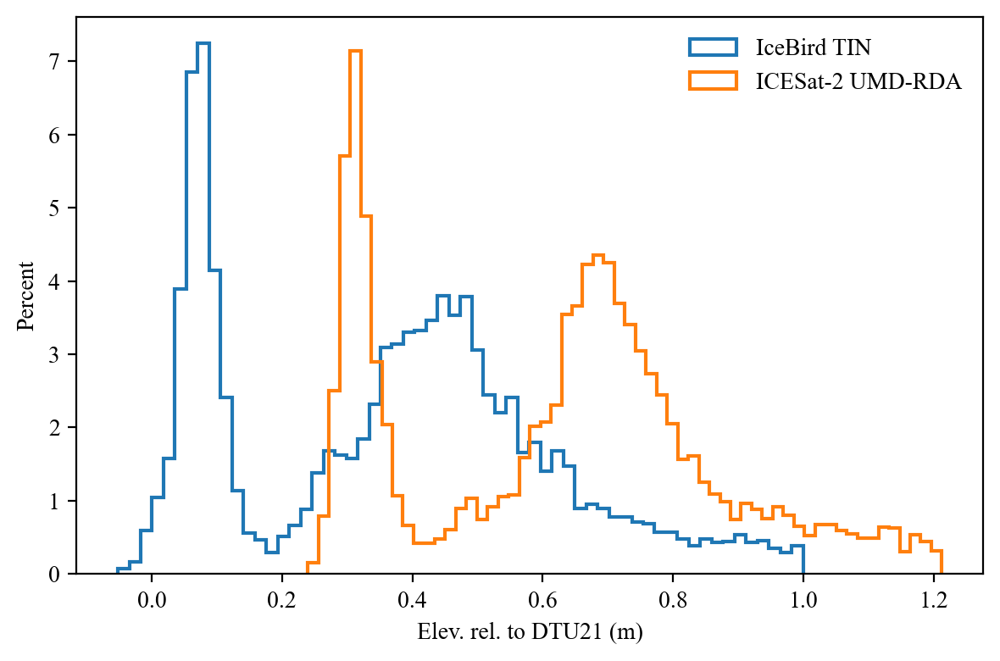

In [15]:
plt.rcParams.update({
    "font.family": "Times New Roman",
    "figure.dpi": 200
})

fig, ax = plt.subplots(figsize=(6, 4))

bins = 60

# Convert counts to percent using weights
weights_is2 = np.ones_like(z_is2_clean) * 100 / len(z_is2_clean)
weights_oib = np.ones_like(z_oib_clean) * 100 / len(z_oib_clean)

ax.hist(z_oib_clean, bins=bins, weights=weights_oib,
        histtype="step", linewidth=1.5, label="IceBird TIN")

ax.hist(z_is2_clean, bins=bins, weights=weights_is2,
        histtype="step", linewidth=1.5, label="ICESat-2 UMD-RDA")

ax.set_xlabel("Elev. rel. to DTU21 (m)")
ax.set_ylabel("Percent")
ax.legend(frameon=False)

plt.tight_layout()
plt.show()

In [16]:
def compute_distribution_stats(z, bins=60):
    z = np.asarray(z)

    # basic statistics
    z_min = np.min(z)
    z_max = np.max(z)
    z_mean = np.mean(z)
    z_std = np.std(z)

    # histogram for percent-based mode
    counts, bin_edges = np.histogram(z, bins=bins)

    # find bin with highest count
    max_bin_index = np.argmax(counts)

    # mode = center of that bin
    mode_value = (bin_edges[max_bin_index] + bin_edges[max_bin_index + 1]) / 2

    return {
        "min": z_min,
        "max": z_max,
        "mean": z_mean,
        "std": z_std,
        "mode": mode_value
    }

In [17]:
stats_is2 = compute_distribution_stats(z_is2_clean, bins=60)
stats_oib = compute_distribution_stats(z_oib_clean, bins=60)

print("ICESat-2:")
for k, v in stats_is2.items():
    print(f"{k}: {v:.3f}")

print("\nIceBird TIN:")
for k, v in stats_oib.items():
    print(f"{k}: {v:.3f}")

ICESat-2:
min: 0.240
max: 1.212
mean: 0.624
std: 0.237
mode: 0.313

IceBird TIN:
min: -0.052
max: 1.000
mean: 0.368
std: 0.241
mode: 0.080


In [18]:
0.313-0.080

0.23299999999999998

In [20]:
df_is2_line_shift = df_is2_line.copy(deep = True)
df_is2_line_shift['z'] = df_is2_line_shift['z'] - 0.23299999999999998

df_is2_peaks_shift = df_is2_peaks.copy(deep = True)
df_is2_peaks_shift['z'] = df_is2_peaks_shift['z'] - 0.23299999999999998

In [29]:
def plot_profiles_with_peaks(
    df_is2_line,
    df_oib_line,
    df_is2_peaks,
    df_oib_peaks,
    xmin,
    xmax
):
    """
    Plot ICESat-2 and IceBridge elevation profiles with detected peaks.

    Parameters
    ----------
    df_is2_line : DataFrame
        Must contain columns ['distance', 'z']
    df_oib_line : DataFrame
        Must contain columns ['distance', 'z']
    df_is2_peaks : DataFrame
        Must contain columns ['distance', 'z']
    df_oib_peaks : DataFrame
        Must contain columns ['distance', 'z']
    xmin : float
        Minimum x-axis limit
    xmax : float
        Maximum x-axis limit
    """

    plt.rcParams.update({
        "font.family": "Times New Roman",
        "figure.dpi": 1200,
    })

    fig, ax = plt.subplots(figsize=(10, 4))

    # Lines
    ax.plot(
        df_is2_line["distance"],
        df_is2_line["z"],
        label="ICESat-2 profile",
        linewidth=1.0,
        antialiased=True,
        color="tab:orange",
    )

    ax.plot(
        df_oib_line["distance"],
        df_oib_line["z"],
        label="IceBridge TIN",
        linewidth=1.0,
        antialiased=True,
        color="tab:blue",
    )

    # Scatter peaks
    ax.scatter(
        df_is2_peaks["distance"],
        df_is2_peaks["z"],
        s=30,
        label="ICESat-2 peaks",
        zorder=5,
        color="tab:orange",
    )

    ax.scatter(
        df_oib_peaks["distance"],
        df_oib_peaks["z"],
        s=30,
        label="IceBird peaks",
        zorder=5,
        color="tab:blue",
    )

    ax.set_xlabel("Distance along the ICESat-2 track (m)", fontsize=12)
    ax.set_ylabel("Elev. rel. to DTU21 (m)", fontsize=12)
    ax.legend(prop={"size": 10})
    ax.grid(True, alpha=0.25)

    # Set x-limits from input parameters
    ax.set_xlim(xmin, xmax)

    plt.tight_layout()
    plt.show()

In [47]:
plt.rcParams.update({
    "font.family": "Times New Roman",
    "figure.dpi": 1200,
})

fig, ax = plt.subplots(figsize=(10, 4))

# lines
ax.plot(df_is2_line_shift["distance"], df_is2_line_shift["z"], label="ICESat-2 profile", linewidth=1.0, antialiased=True, color="tab:orange")
ax.plot(df_oib_line["distance"], df_oib_line["z"], label="IceBird TIN", linewidth=1.0, antialiased=True, color="tab:blue")

# scatter peaks (bigger marker + higher zorder so they sit on top)
ax.scatter(df_is2_peaks_shift["distance"], df_is2_peaks_shift["z"], s=30, label="ICESat-2 peaks", zorder=5, color="tab:orange")
ax.scatter(df_oib_peaks["distance"], df_oib_peaks["z"], s=30, label="IceBird peaks", zorder=5, color="tab:blue")

ax.set_xlabel("Distance along the ICESat-2 track (m)", fontsize=12)
ax.set_ylabel("Elev. rel. to DTU21 (m)", fontsize=12)
ax.legend(prop={"size": 10})
ax.grid(True, alpha=0.25)

plt.tight_layout()
plt.show()

#### display a small part

In [45]:
plot_profiles_with_peaks(
    df_is2_line_shift,
    df_oib_line,
    df_is2_peaks_shift,
    df_oib_peaks,
    xmin=500,
    xmax=700
)

In [31]:
plot_profiles_with_peaks(
    df_is2_line_shift,
    df_oib_line,
    df_is2_peaks_shift,
    df_oib_peaks,
    xmin=1100,
    xmax=1500
)

In [32]:
plot_profiles_with_peaks(
    df_is2_line_shift,
    df_oib_line,
    df_is2_peaks_shift,
    df_oib_peaks,
    xmin=2000,
    xmax=2200
)

In [33]:
plot_profiles_with_peaks(
    df_is2_line_shift,
    df_oib_line,
    df_is2_peaks_shift,
    df_oib_peaks,
    xmin=2300,
    xmax=2200
)

In [34]:
plot_profiles_with_peaks(
    df_is2_line_shift,
    df_oib_line,
    df_is2_peaks_shift,
    df_oib_peaks,
    xmin=2600,
    xmax=2800
)

In [36]:
plot_profiles_with_peaks(
    df_is2_line_shift,
    df_oib_line,
    df_is2_peaks_shift,
    df_oib_peaks,
    xmin=3200,
    xmax=3500
)

In [38]:
plot_profiles_with_peaks(
    df_is2_line_shift,
    df_oib_line,
    df_is2_peaks_shift,
    df_oib_peaks,
    xmin=3700,
    xmax=4000
)

In [39]:
plot_profiles_with_peaks(
    df_is2_line_shift,
    df_oib_line,
    df_is2_peaks_shift,
    df_oib_peaks,
    xmin=5700,
    xmax=5900
)

In [44]:
plot_profiles_with_peaks(
    df_is2_line_shift,
    df_oib_line,
    df_is2_peaks_shift,
    df_oib_peaks,
    xmin=5780,
    xmax=5870
)

In [22]:
z_is2_shift = df_is2_line_shift["z"].to_numpy()
z_oib = df_oib_line["z"].to_numpy()

# remove outliers whose elevation is outside two times of the 
def remove_outliers_2sigma(z):
    mean = np.mean(z)
    std  = np.std(z)
    mask = np.abs(z - mean) <= 2 * std
    return z[mask]

z_is2_shift_clean = remove_outliers_2sigma(z_is2_shift)
z_oib_clean = remove_outliers_2sigma(z_oib)

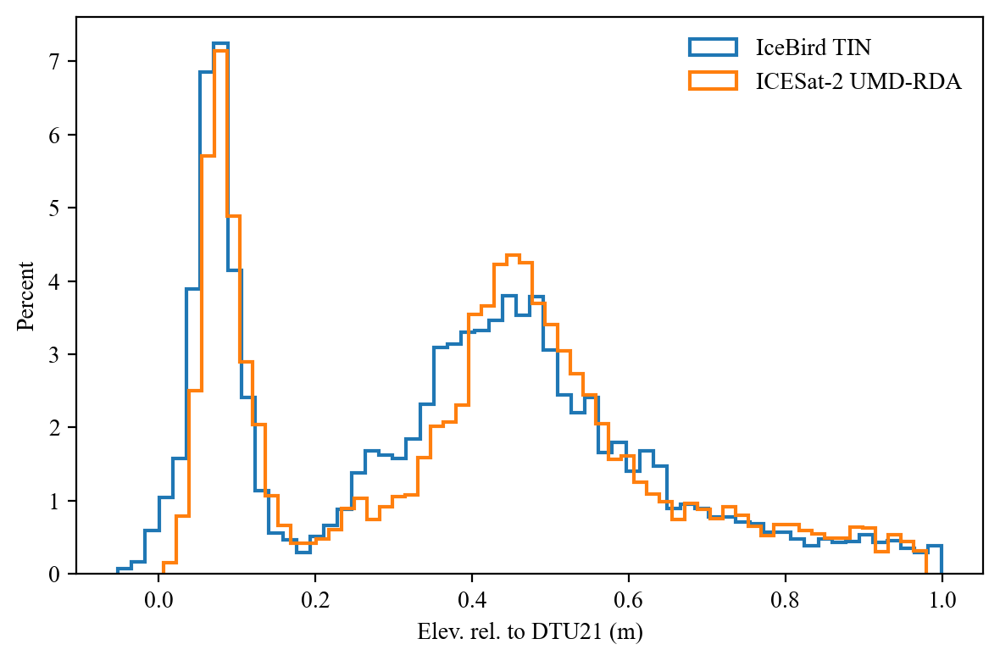

In [23]:
plt.rcParams.update({
    "font.family": "Times New Roman",
    "figure.dpi": 200
})

fig, ax = plt.subplots(figsize=(6, 4))

bins = 60

# Convert counts to percent using weights
weights_is2 = np.ones_like(z_is2_clean) * 100 / len(z_is2_clean)
weights_oib = np.ones_like(z_oib_clean) * 100 / len(z_oib_clean)

ax.hist(z_oib_clean, bins=bins, weights=weights_oib,
        histtype="step", linewidth=1.5, label="IceBird TIN")

ax.hist(z_is2_shift_clean, bins=bins, weights=weights_is2,
        histtype="step", linewidth=1.5, label="ICESat-2 UMD-RDA")

ax.set_xlabel("Elev. rel. to DTU21 (m)")
ax.set_ylabel("Percent")
ax.legend(frameon=False)

plt.tight_layout()
plt.show()

In [24]:
stats_oib = compute_distribution_stats(z_oib_clean, bins=60)
stats_is2 = compute_distribution_stats(z_is2_shift_clean, bins=60)

print("ICESat-2:")
for k, v in stats_is2.items():
    print(f"{k}: {v:.3f}")

print("\nIceBird TIN:")
for k, v in stats_oib.items():
    print(f"{k}: {v:.3f}")

ICESat-2:
min: 0.007
max: 0.979
mean: 0.391
std: 0.237
mode: 0.080

IceBird TIN:
min: -0.052
max: 1.000
mean: 0.368
std: 0.241
mode: 0.080
